# Plot signatures

In [81]:
import geopandas as gpd
from shapely.geometry import Point, Polygon
import urbangrammar_graphics as ugg
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.lines import Line2D
import contextily

In [82]:
sns.set(context="paper", style="ticks", rc={'patch.force_edgecolor': False})

In [83]:
token = "pk.eyJ1IjoibWFydGluZmxlaXMiLCJhIjoiY2tsNmhlemtxMmlicTJubXN6and5aTc2NCJ9.l7nSUXM7ZRjAWTB7oXiswQ"

In [84]:
def add_maps(ax, crs, token=token, bg=True, lbls=True, roads=True):
    if roads:
        contextily.add_basemap(
            ax, 
            crs=crs, 
            source=ugg.get_tiles('roads', token), 
            zorder=2, 
            alpha=.2
        )
    if lbls:
        contextily.add_basemap(
            ax, 
            crs=crs, 
            source=ugg.get_tiles('labels', token), 
            zorder=3, 
            alpha=1
        )
    if bg:
        contextily.add_basemap(
            ax, 
            crs=crs, 
            source=ugg.get_tiles('background', token), 
            zorder=-1, 
            alpha=1
        )
    return ax

## Spatial Signatures

In [85]:
#spsig = gpd.read_parquet("../../urbangrammar_samba/spatial_signatures/signatures/signatures_combined_levels_simplified.pq")
spsig = gpd.read_file((
    "/home/jovyan/work/Desktop/data/spatial_signatures/"\
    "signatures_combined_levels_simplified.gpkg"
))

/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:577: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


In [86]:
spsig.signature_type.unique()

array(['0_0', '1_0', '3_0', '4_0', '5_0', '6_0', '7_0', '8_0', '2_0',
       '2_1', '2_2', '9_0', '9_1', '9_2', '9_3', '9_4', '9_5', '9_6',
       '9_7', '9_8'], dtype=object)

In [87]:
cmap = ugg.get_colormap(spsig.signature_type.nunique(), randomize=False)

In [88]:
cols = cmap.colors

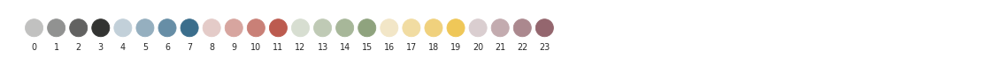

In [89]:
fig, ax = plt.subplots(figsize=(20, 5))
for i, c in enumerate(cols):
    ax.add_artist(plt.Circle((i, 0), 0.4, color=c))
    plt.text(i, -1, i, horizontalalignment='center')
    ax.set_axis_off()
    ax.set_aspect(1)
    ax.autoscale()
    plt.xlim(-1.25,43.25)
    plt.ylim(-1,1)

In [90]:
symbology = {
     '0_0': cols[16],
     '1_0': cols[15],
     '3_0': cols[9],
     '4_0': cols[12],
     '5_0': cols[21],
     '6_0': cols[8],
     '7_0': cols[4],
     '8_0': cols[18],
     '2_0': cols[6],
     '2_1': cols[23],
     '2_2': cols[19],
     '9_0': cols[7],
     '9_1': cols[3],
     '9_2': cols[22],
     '9_3': cols[0], # outlier
     '9_4': cols[11],
     '9_5': cols[14],
     '9_6': cols[0], # outlier
     '9_7': cols[0], # outlier
     '9_8': cols[0], # outlier
}

In [93]:
spsig = spsig.to_crs(3857)

In [94]:
df = spsig

### Cluster colors

Rural (0, 4, 7):

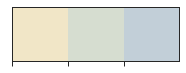

In [95]:
sns.palplot([cols[16], cols[12], cols[4]])

Urban - periphery (3)

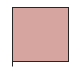

In [96]:
sns.palplot([cols[9]])

Urban - suburbs (1, 8)

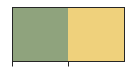

In [97]:
sns.palplot([cols[15], cols[18]])

Urban - cities (2, 6, 9, 5)

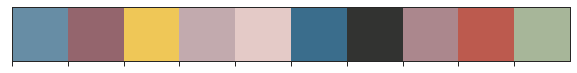

In [98]:
urb = [
    '2_0', 
    '2_1', 
    '2_2', 
    '5_0', 
    '6_0', 
    '9_0', 
    '9_1', 
    '9_2', 
    '9_4', 
    '9_5'
]
sns.palplot([symbology[i] for i in urb])

### Great Britain

In [16]:
token

'pk.eyJ1IjoibWFydGluZmxlaXMiLCJhIjoiY2tsNmhlemtxMmlicTJubXN6and5aTc2NCJ9.l7nSUXM7ZRjAWTB7oXiswQ'

In [18]:
ugg.get_tiles('roads', token)

{'url': 'https://api.mapbox.com/styles/v1/martinfleis/ckl6jkuwe3uxa17mrhnp78e62/tiles/256/{z}/{x}/{y}@2x?access_token={accessToken}',
 'attribution': '(C) Mapbox (C) OpenStreetMap contributors',
 'accessToken': 'pk.eyJ1IjoibWFydGluZmxlaXMiLCJhIjoiY2tsNmhlemtxMmlicTJubXN6and5aTc2NCJ9.l7nSUXM7ZRjAWTB7oXiswQ',
 'name': 'MapBox Roads'}

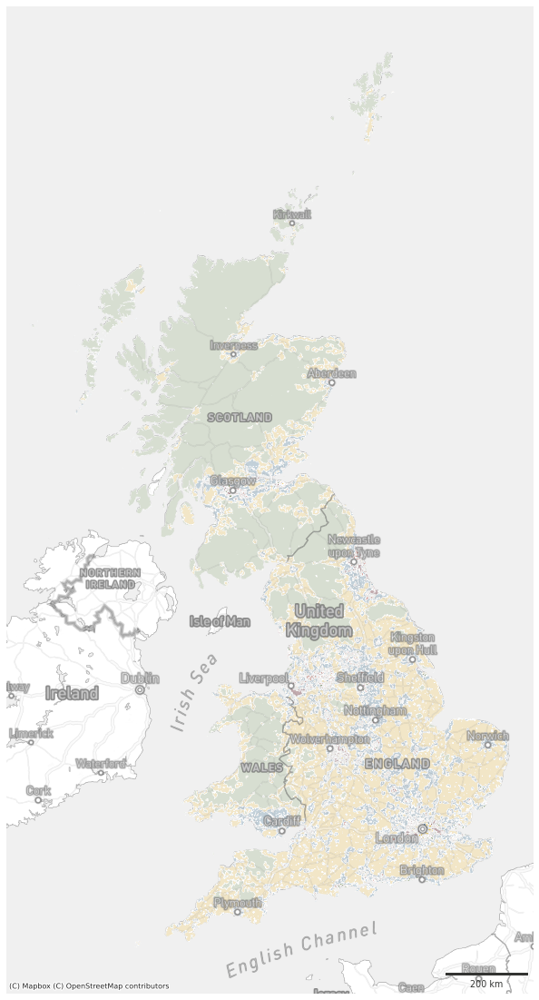

In [14]:
ax = df.plot(color=df['signature_type'].map(symbology), figsize=(20, 20), zorder=1, linewidth=.3, edgecolor='w', alpha=1)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('roads', token), zorder=2, alpha=.3)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('labels', token), zorder=3, alpha=1)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('background', token), zorder=-1, alpha=1)
ax.set_axis_off()

scalebar = ScaleBar(dx=1,
                    color=ugg.COLORS[0],
                    location='lower right',
                    height_fraction=0.002,
                    pad=.5,
                    frameon=False,
                    )
ax.add_artist(scalebar)

# ugg.north_arrow(plt.gcf(), ax, 0, size=.05, linewidth=1, color=ugg.COLORS[0], loc="upper left", pad=.002, alpha=.9)

# custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=10, color=color) for color in symbology.values()]
# leg_points = ax.legend(custom_points, symbology.keys(), bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True)
# ax.add_artist(leg_points)

#plt.savefig("../fig/gb/signatures_gb.png", dpi=300, bbox_inches="tight")

### London

In [65]:
london = gpd.GeoSeries([Point(-0.10875602230396436, 51.50933674406198)], crs=4326).to_crs(3857).buffer(35000).total_bounds

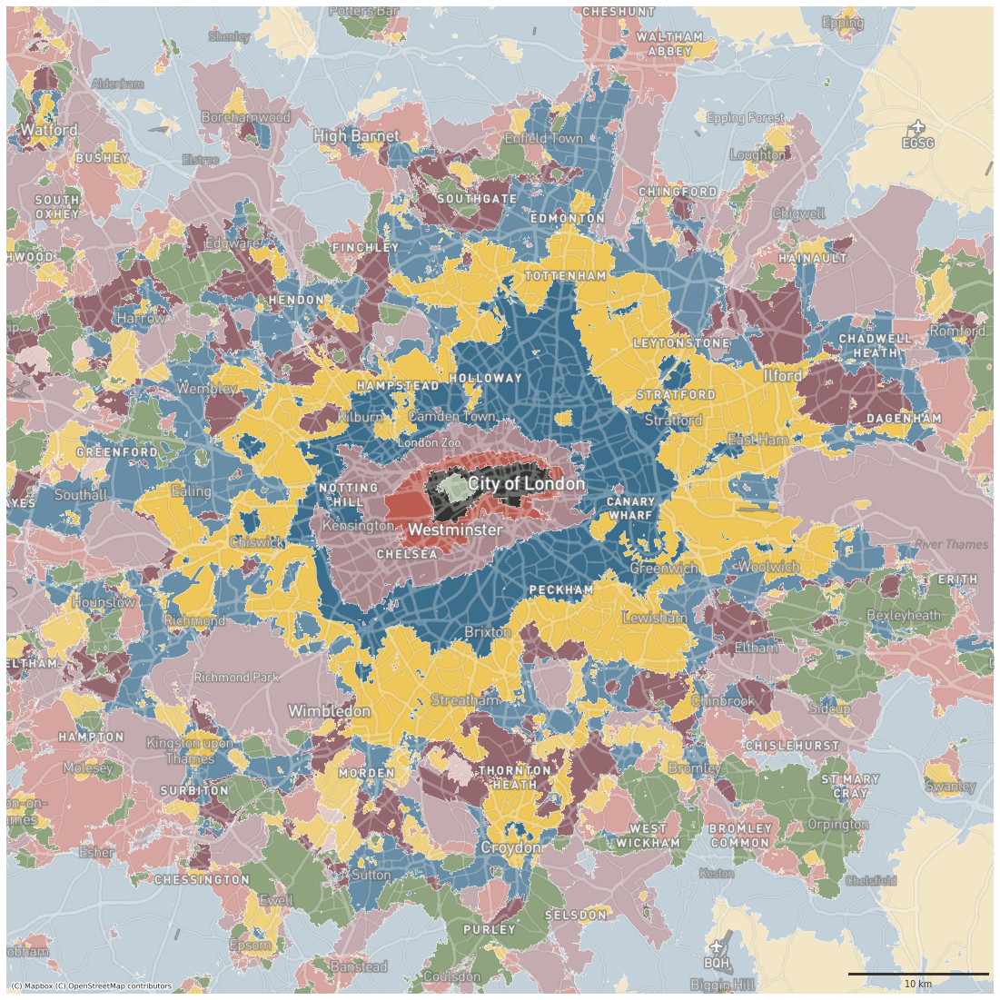

In [66]:
ax = df.plot(color=df['signature_type'].map(symbology), figsize=(20, 20), zorder=1, linewidth=.3, edgecolor='w', alpha=1)

ax.set_xlim(london[0], london[2])
ax.set_ylim(london[1], london[3])

contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('roads', token), zorder=2, alpha=.3)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('labels', token), zorder=3, alpha=1)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('background', token), zorder=-1, alpha=1)
ax.set_axis_off()

scalebar = ScaleBar(dx=1,
                    color=ugg.COLORS[0],
                    location='lower right',
                    height_fraction=0.002,
                    pad=.5,
                    frameon=False,
                    )
ax.add_artist(scalebar)

# ugg.north_arrow(plt.gcf(), ax, 0, size=.05, linewidth=1, color=ugg.COLORS[0], loc="upper left", pad=.002, alpha=.9)

# custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=10, color=color) for color in symbology.values()]
# leg_points = ax.legend(custom_points, symbology.keys(), bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True)
# ax.add_artist(leg_points)
plt.savefig("figures/signatures_london.png", dpi=300, bbox_inches="tight")

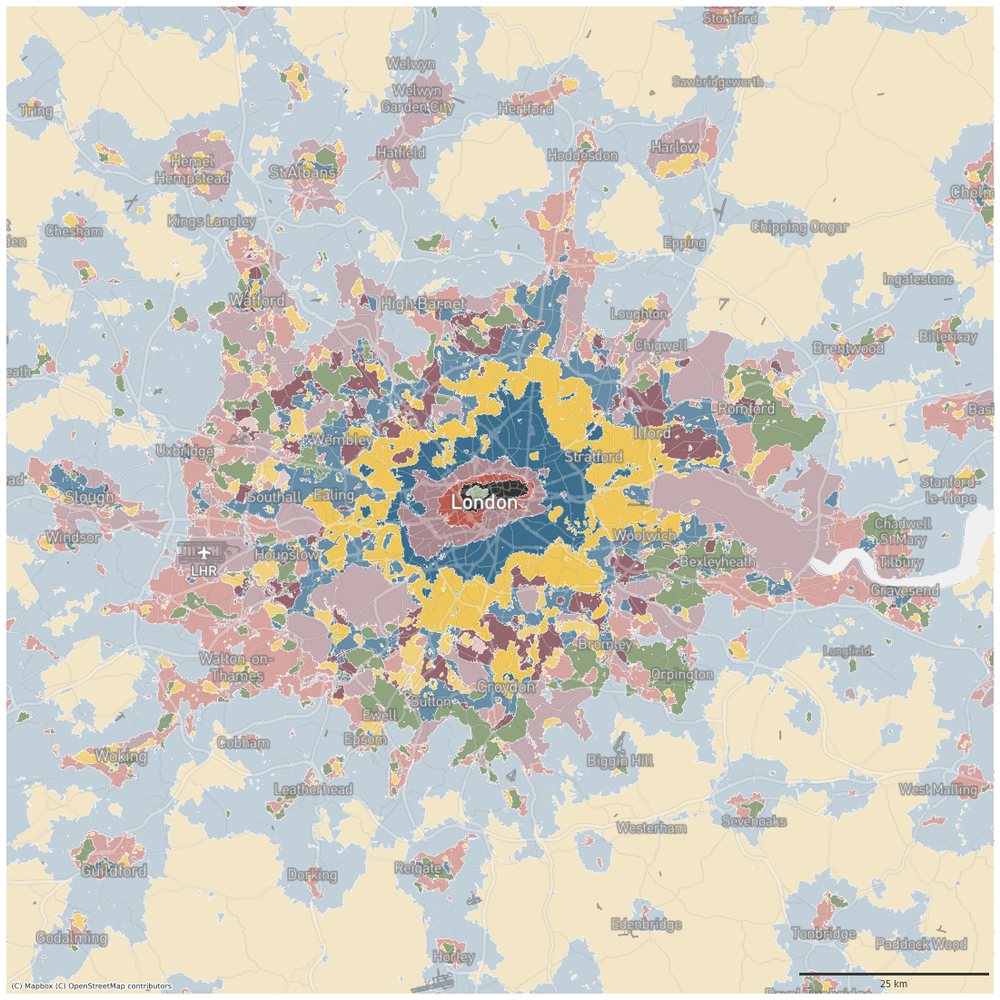

In [67]:
london_metro = gpd.GeoSeries([Point(-0.10875602230396436, 51.50933674406198)], crs=4326).to_crs(3857).buffer(65000).total_bounds

ax = df.plot(color=df['signature_type'].map(symbology), figsize=(20, 20), zorder=1, linewidth=.3, edgecolor='w', alpha=1)

ax.set_xlim(london_metro[0], london_metro[2])
ax.set_ylim(london_metro[1], london_metro[3])

contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('roads', token), zorder=2, alpha=.3)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('labels', token), zorder=3, alpha=1)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('background', token), zorder=-1, alpha=1)
ax.set_axis_off()

scalebar = ScaleBar(dx=1,
                    color=ugg.COLORS[0],
                    location='lower right',
                    height_fraction=0.002,
                    pad=.5,
                    frameon=False,
                    )
ax.add_artist(scalebar)

# ugg.north_arrow(plt.gcf(), ax, 0, size=.05, linewidth=1, color=ugg.COLORS[0], loc="upper left", pad=.002, alpha=.9)

# custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=10, color=color) for color in symbology.values()]
# leg_points = ax.legend(custom_points, symbology.keys(), bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True)
# ax.add_artist(leg_points)
plt.savefig("figures/signatures_london_metro.png", dpi=300, bbox_inches="tight")

### Birmingham

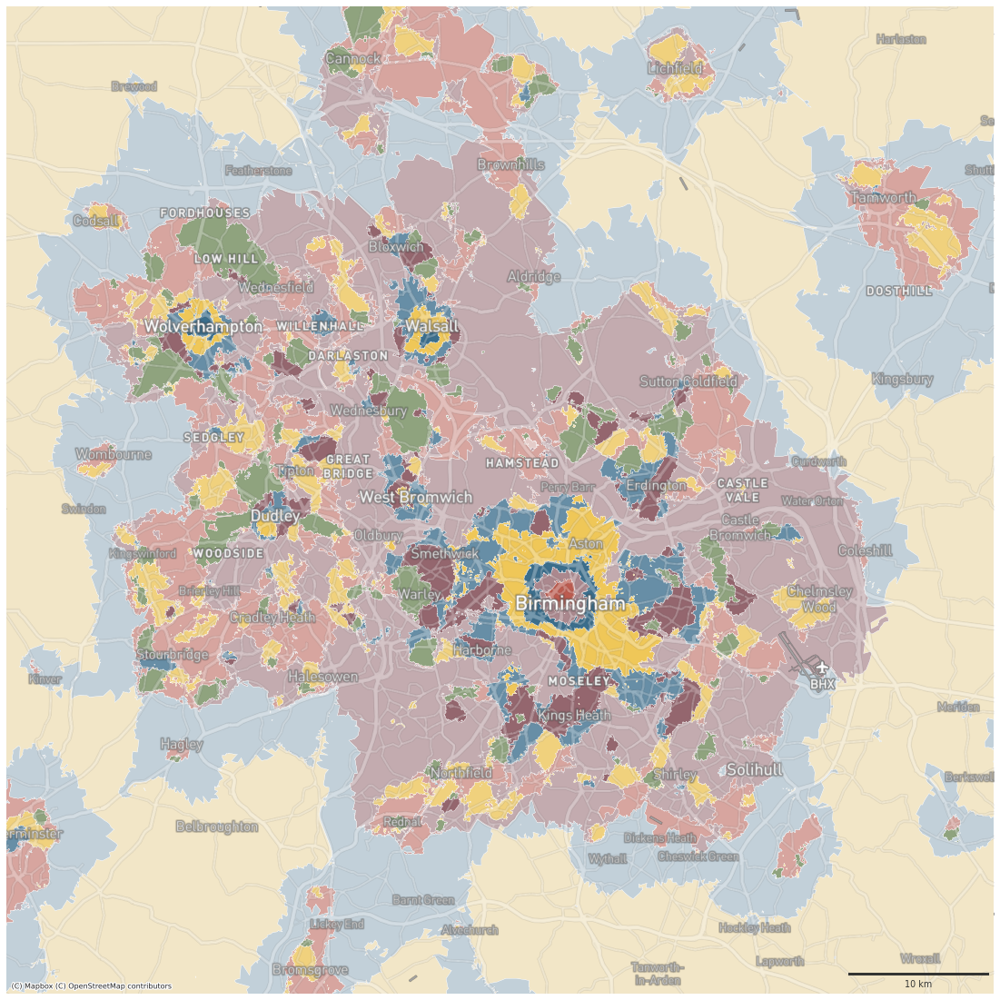

In [68]:
birmingham = gpd.GeoSeries([Point(-1.9836323453459492, 52.51781818221639)], crs=4326).to_crs(3857).buffer(35000).total_bounds

ax = df.plot(color=df['signature_type'].map(symbology), figsize=(20, 20), zorder=1, linewidth=.3, edgecolor='w', alpha=1)

ax.set_xlim(birmingham[0]+5000, birmingham[2]+5000)
ax.set_ylim(birmingham[1], birmingham[3])

contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('roads', token), zorder=2, alpha=.3)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('labels', token), zorder=3, alpha=1)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('background', token), zorder=-1, alpha=1)
ax.set_axis_off()

scalebar = ScaleBar(dx=1,
                    color=ugg.COLORS[0],
                    location='lower right',
                    height_fraction=0.002,
                    pad=.5,
                    frameon=False,
                    )
ax.add_artist(scalebar)

# ugg.north_arrow(plt.gcf(), ax, 0, size=.05, linewidth=1, color=ugg.COLORS[0], loc="upper left", pad=.002, alpha=.9)

# custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=10, color=color) for color in symbology.values()]
# leg_points = ax.legend(custom_points, symbology.keys(), bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True)
# ax.add_artist(leg_points)
plt.savefig("figures/signatures_birmingham.png", dpi=300, bbox_inches="tight")

### North West

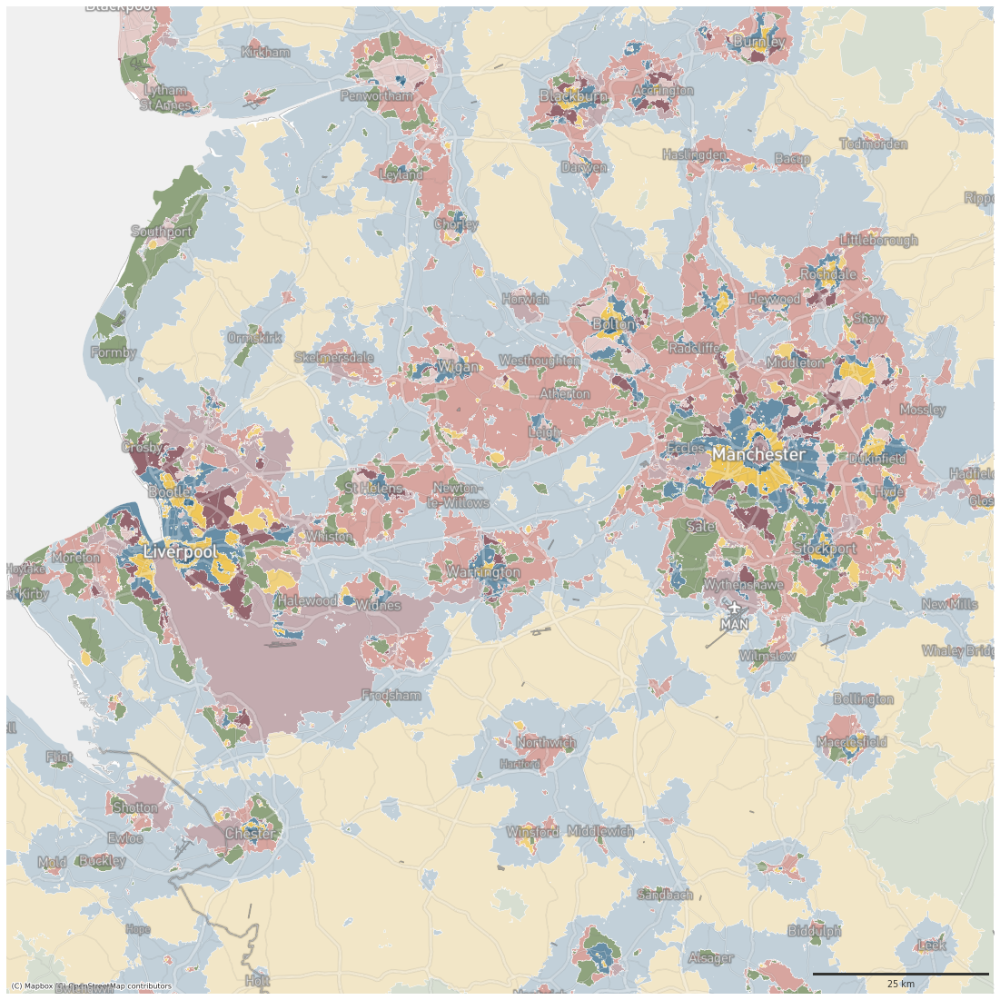

In [69]:
lpool = gpd.GeoSeries([Point(-2.5731000246573963, 53.44502036089582,)], crs=4326).to_crs(3857).buffer(70000).total_bounds

ax = df.plot(color=df['signature_type'].map(symbology), figsize=(20, 20), zorder=1, linewidth=.3, edgecolor='w', alpha=1)

ax.set_xlim(lpool[0], lpool[2])
ax.set_ylim(lpool[1], lpool[3])

contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('roads', token), zorder=2, alpha=.3)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('labels', token), zorder=3, alpha=1)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('background', token), zorder=-1, alpha=1)
ax.set_axis_off()

scalebar = ScaleBar(dx=1,
                    color=ugg.COLORS[0],
                    location='lower right',
                    height_fraction=0.002,
                    pad=.5,
                    frameon=False,
                    )
ax.add_artist(scalebar)

# ugg.north_arrow(plt.gcf(), ax, 0, size=.05, linewidth=1, color=ugg.COLORS[0], loc="upper left", pad=.002, alpha=.9)

# custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=10, color=color) for color in symbology.values()]
# leg_points = ax.legend(custom_points, symbology.keys(), bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True)
# ax.add_artist(leg_points)
plt.savefig("figures/signatures_lpool.png", dpi=300, bbox_inches="tight")

### Scottish Belt

#### All

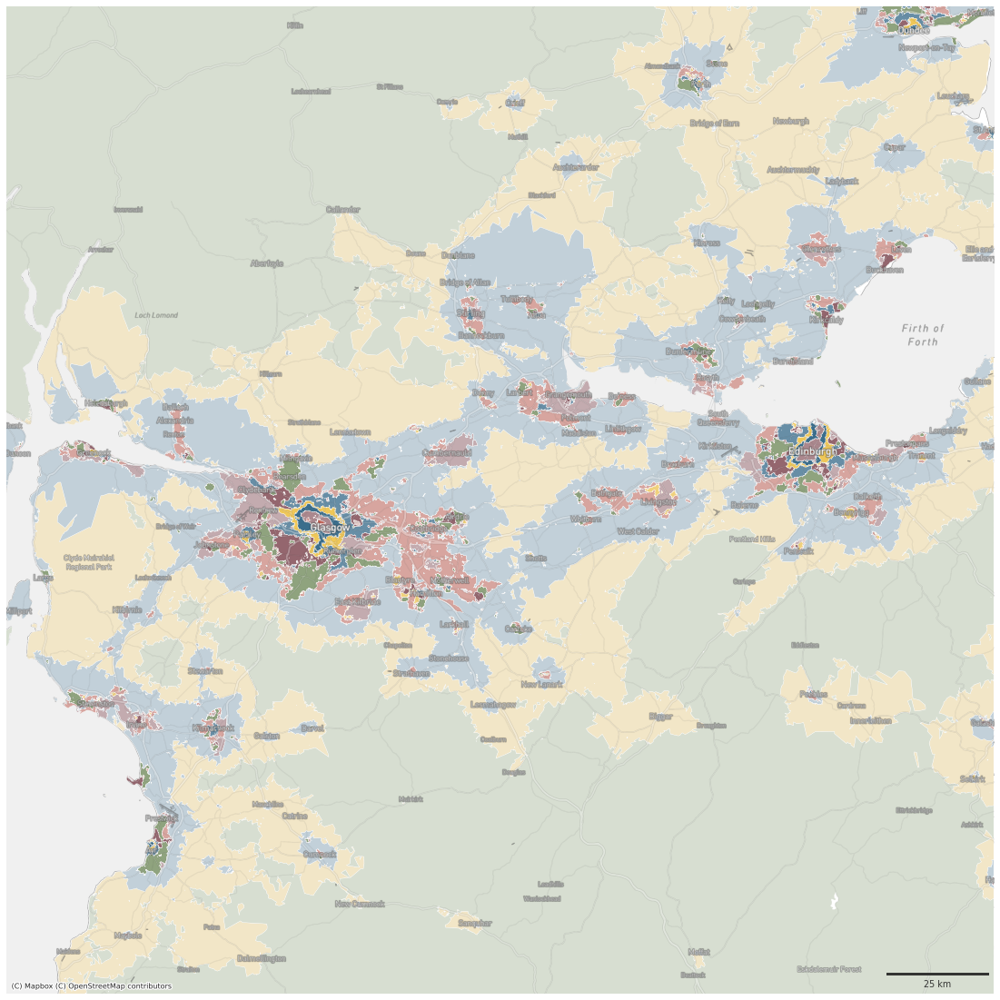

In [110]:
belt = gpd.GeoSeries([Point(-3.8718635546837663, 55.89080727223461)], crs=4326).to_crs(3857).buffer(120000).total_bounds

ax = df.plot(color=df['signature_type'].map(symbology), figsize=(20, 20), zorder=1, linewidth=.3, edgecolor='w', alpha=1)

ax.set_xlim(belt[0], belt[2])
ax.set_ylim(belt[1], belt[3])

contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('roads', token), zorder=2, alpha=.3)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('labels', token), zorder=3, alpha=1)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('background', token), zorder=-1, alpha=1)
ax.set_axis_off()

scalebar = ScaleBar(dx=1,
                    color=ugg.COLORS[0],
                    location='lower right',
                    height_fraction=0.002,
                    pad=.5,
                    frameon=False,
                    )
ax.add_artist(scalebar)

# ugg.north_arrow(plt.gcf(), ax, 0, size=.05, linewidth=1, color=ugg.COLORS[0], loc="upper left", pad=.002, alpha=.9)

# custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=10, color=color) for color in symbology.values()]
# leg_points = ax.legend(custom_points, symbology.keys(), bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True)
# ax.add_artist(leg_points)
plt.savefig("../fig/gb/signatures_scottish_belt.png", dpi=300, bbox_inches="tight")

#### Rural

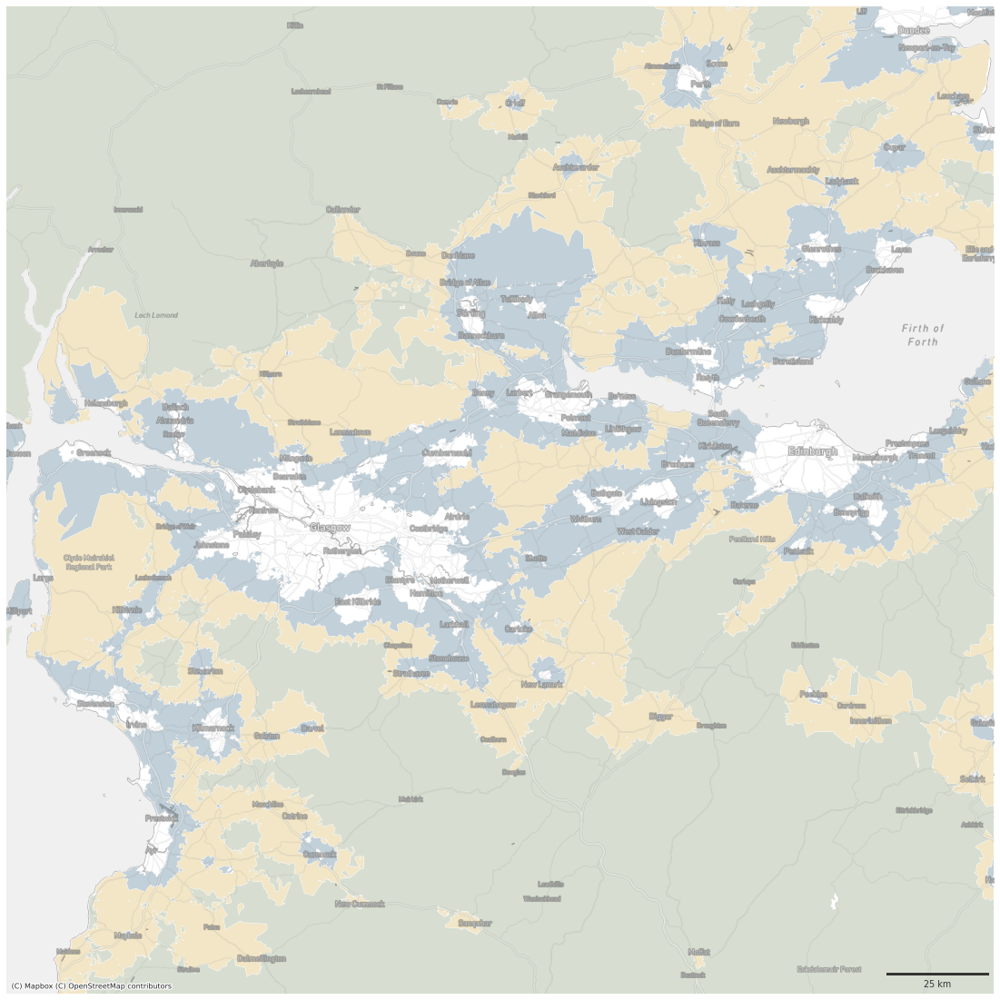

In [111]:
belt = gpd.GeoSeries([Point(-3.8718635546837663, 55.89080727223461)], crs=4326).to_crs(3857).buffer(120000).total_bounds

selection = ['0_0', '4_0', '7_0']
ax = df[
    df.signature_type.isin(selection)
].plot(
    color=df[
        df.signature_type.isin(selection)
    ]['signature_type'].map(symbology), 
    figsize=(20, 20), 
    zorder=1, 
    linewidth=.3, 
    edgecolor='w', 
    alpha=1
)

ax.set_xlim(belt[0], belt[2])
ax.set_ylim(belt[1], belt[3])

contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('roads', token), zorder=2, alpha=.3)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('labels', token), zorder=3, alpha=1)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('background', token), zorder=-1, alpha=1)
ax.set_axis_off()

scalebar = ScaleBar(dx=1,
                    color=ugg.COLORS[0],
                    location='lower right',
                    height_fraction=0.002,
                    pad=.5,
                    frameon=False,
                    )
ax.add_artist(scalebar)

# ugg.north_arrow(plt.gcf(), ax, 0, size=.05, linewidth=1, color=ugg.COLORS[0], loc="upper left", pad=.002, alpha=.9)

# custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=10, color=color) for color in symbology.values()]
# leg_points = ax.legend(custom_points, symbology.keys(), bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True)
# ax.add_artist(leg_points)
plt.savefig("../fig/gb/signatures_scottish_belt_rural.png", dpi=300, bbox_inches="tight")

#### Urban - periphery

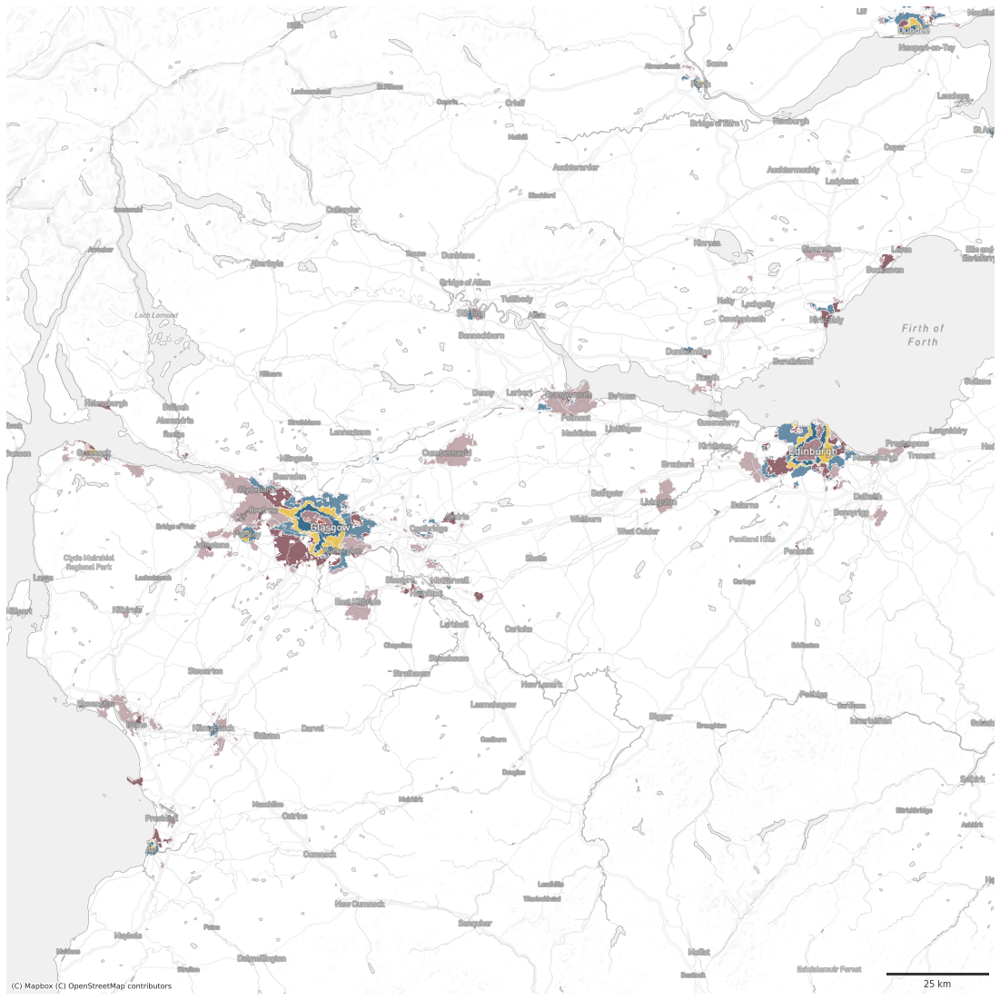

In [115]:
belt = gpd.GeoSeries([Point(-3.8718635546837663, 55.89080727223461)], crs=4326).to_crs(3857).buffer(120000).total_bounds

selection = ['0_3', '0_8'] + urb
ax = df[
    df.signature_type.isin(selection)
].plot(
    color=df[
        df.signature_type.isin(selection)
    ]['signature_type'].map(symbology), 
    figsize=(20, 20), 
    zorder=1, 
    linewidth=.3, 
    edgecolor='w', 
    alpha=1
)

ax.set_xlim(belt[0], belt[2])
ax.set_ylim(belt[1], belt[3])

contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('roads', token), zorder=2, alpha=.3)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('labels', token), zorder=3, alpha=1)
contextily.add_basemap(ax, crs=df.crs, source=ugg.get_tiles('background', token), zorder=-1, alpha=1)
ax.set_axis_off()

scalebar = ScaleBar(dx=1,
                    color=ugg.COLORS[0],
                    location='lower right',
                    height_fraction=0.002,
                    pad=.5,
                    frameon=False,
                    )
ax.add_artist(scalebar)

# ugg.north_arrow(plt.gcf(), ax, 0, size=.05, linewidth=1, color=ugg.COLORS[0], loc="upper left", pad=.002, alpha=.9)

# custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=10, color=color) for color in symbology.values()]
# leg_points = ax.legend(custom_points, symbology.keys(), bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True)
# ax.add_artist(leg_points)
plt.savefig("../fig/gb/signatures_scottish_belt_urban.png", dpi=300, bbox_inches="tight")

## Hierarchy of *urbanity*

### Tier 1 - London

In [47]:
london_tier1

array([-2.21066650e+04,  6.70188887e+06, -2.10666502e+03,  6.72188887e+06])

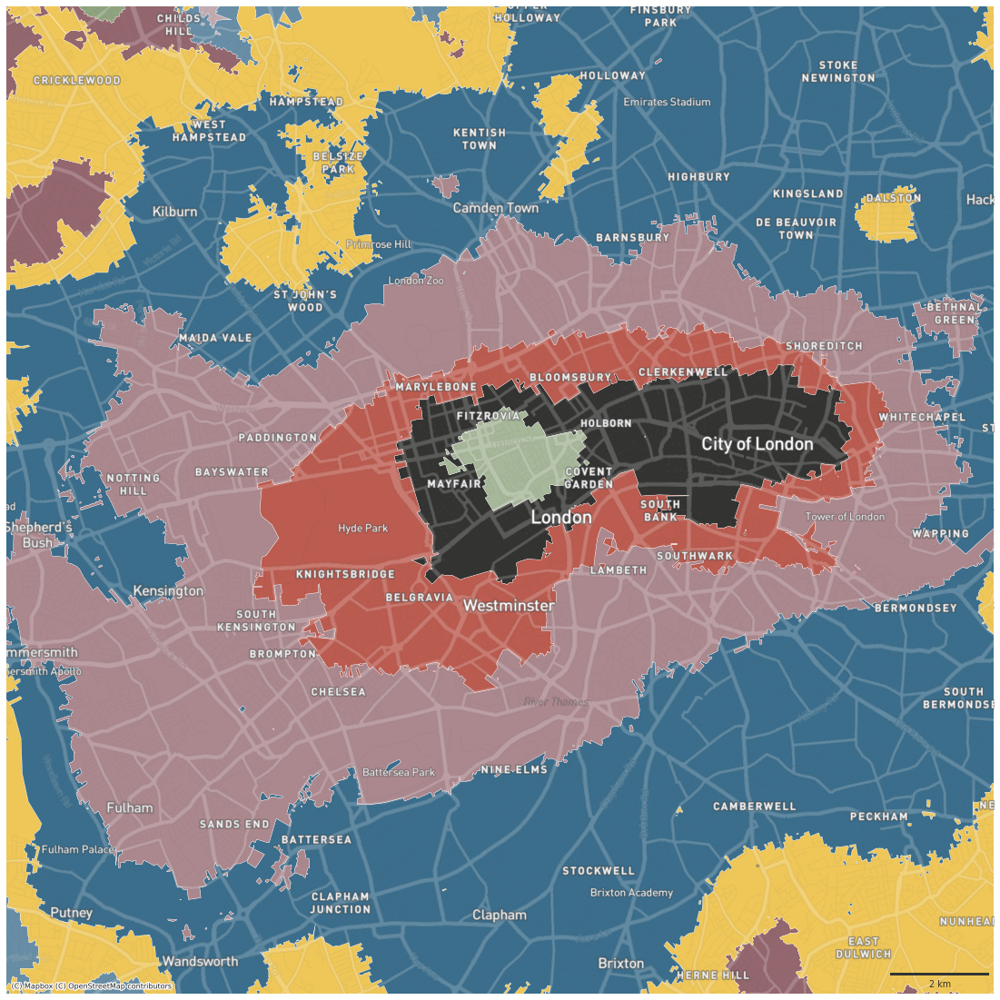

In [57]:
london_tier1 = gpd.GeoSeries(
    [Point(-0.13875602230396436, 51.50933674406198)], 
    crs=4326
).to_crs(3857).buffer(10000).total_bounds

selection = ['9_5', '9_1', '9_4', '9_2']

ax = df.plot(
    color=df['signature_type'].map(symbology),
    figsize=(20, 20), 
    zorder=1, 
    linewidth=.3, 
    edgecolor='w', 
    alpha=1
)
ax.set_xlim(london_tier1[0], london_tier1[2])
ax.set_ylim(london_tier1[1], london_tier1[3])

ax = add_maps(ax, df.crs, roads=True, lbls=True)
ax.set_axis_off()

scalebar = ScaleBar(
    dx=1,
    color=ugg.COLORS[0],
    location='lower right',
    height_fraction=0.002,
    pad=.5,
    frameon=False,
)
ax.add_artist(scalebar)
plt.savefig(
    "../fig/gb/urb_tier_1.png", dpi=300, bbox_inches="tight"
);

### Tier 2 - Leeds

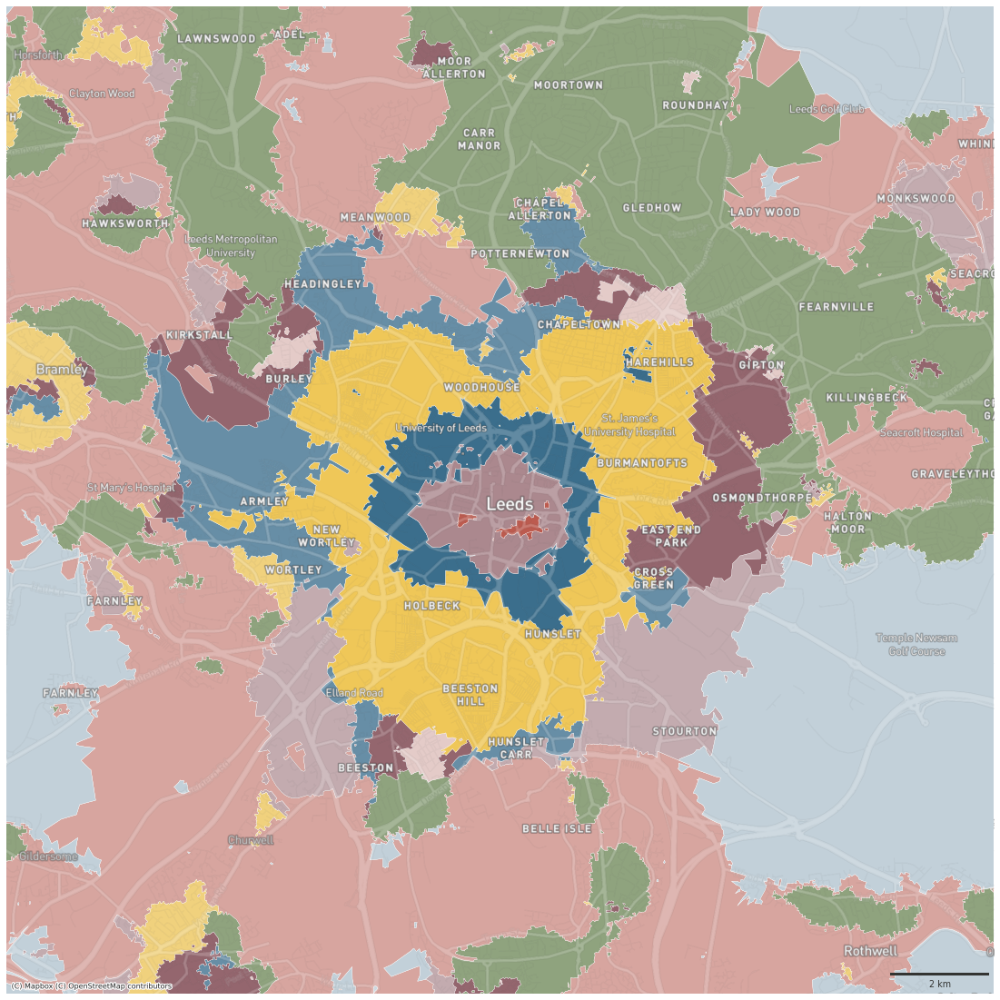

In [60]:
london_tier1 = gpd.GeoSeries(
    [Point(-1.5454673767089844, 53.79791340655199)], 
    crs=4326
).to_crs(3857).buffer(10000).total_bounds

selection = ['9_5', '9_1', '9_4', '9_2']

ax = df.plot(
    color=df['signature_type'].map(symbology),
    figsize=(20, 20), 
    zorder=1, 
    linewidth=.3, 
    edgecolor='w', 
    alpha=1
)
ax.set_xlim(london_tier1[0], london_tier1[2])
ax.set_ylim(london_tier1[1], london_tier1[3])

ax = add_maps(ax, df.crs, roads=True, lbls=True)
ax.set_axis_off()

scalebar = ScaleBar(
    dx=1,
    color=ugg.COLORS[0],
    location='lower right',
    height_fraction=0.002,
    pad=.5,
    frameon=False,
)
ax.add_artist(scalebar)
plt.savefig(
    "../fig/gb/urb_tier_2.png", dpi=300, bbox_inches="tight"
);

### Tier 3 - Cardiff

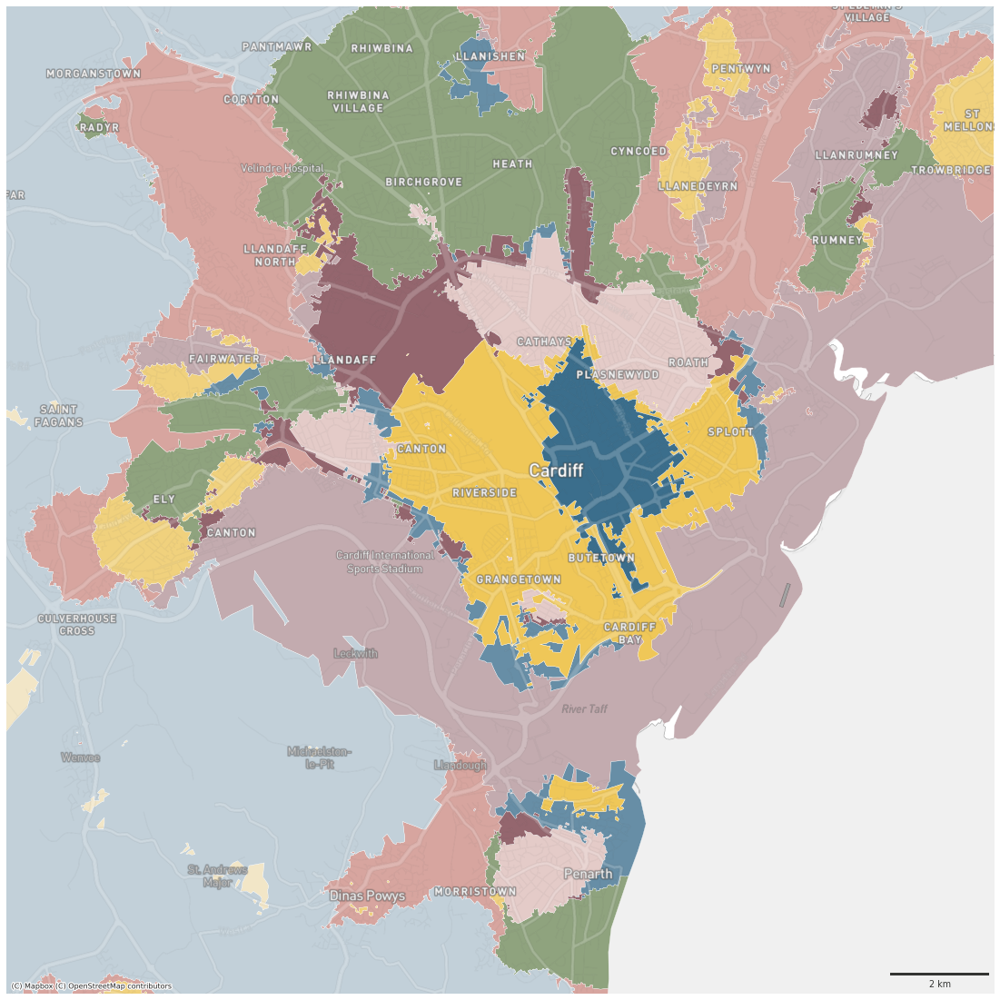

In [59]:
london_tier1 = gpd.GeoSeries(
    [Point(-3.189296722412109, 51.47838944760879)], 
    crs=4326
).to_crs(3857).buffer(10000).total_bounds

selection = ['9_5', '9_1', '9_4', '9_2']

ax = df.plot(
    color=df['signature_type'].map(symbology),
    figsize=(20, 20), 
    zorder=1, 
    linewidth=.3, 
    edgecolor='w', 
    alpha=1
)
ax.set_xlim(london_tier1[0], london_tier1[2])
ax.set_ylim(london_tier1[1], london_tier1[3])

ax = add_maps(ax, df.crs, roads=True, lbls=True)
ax.set_axis_off()

scalebar = ScaleBar(
    dx=1,
    color=ugg.COLORS[0],
    location='lower right',
    height_fraction=0.002,
    pad=.5,
    frameon=False,
)
ax.add_artist(scalebar)
plt.savefig(
    "../fig/gb/urb_tier_3.png", dpi=300, bbox_inches="tight"
);

### Tier 4 - Milton Keynes

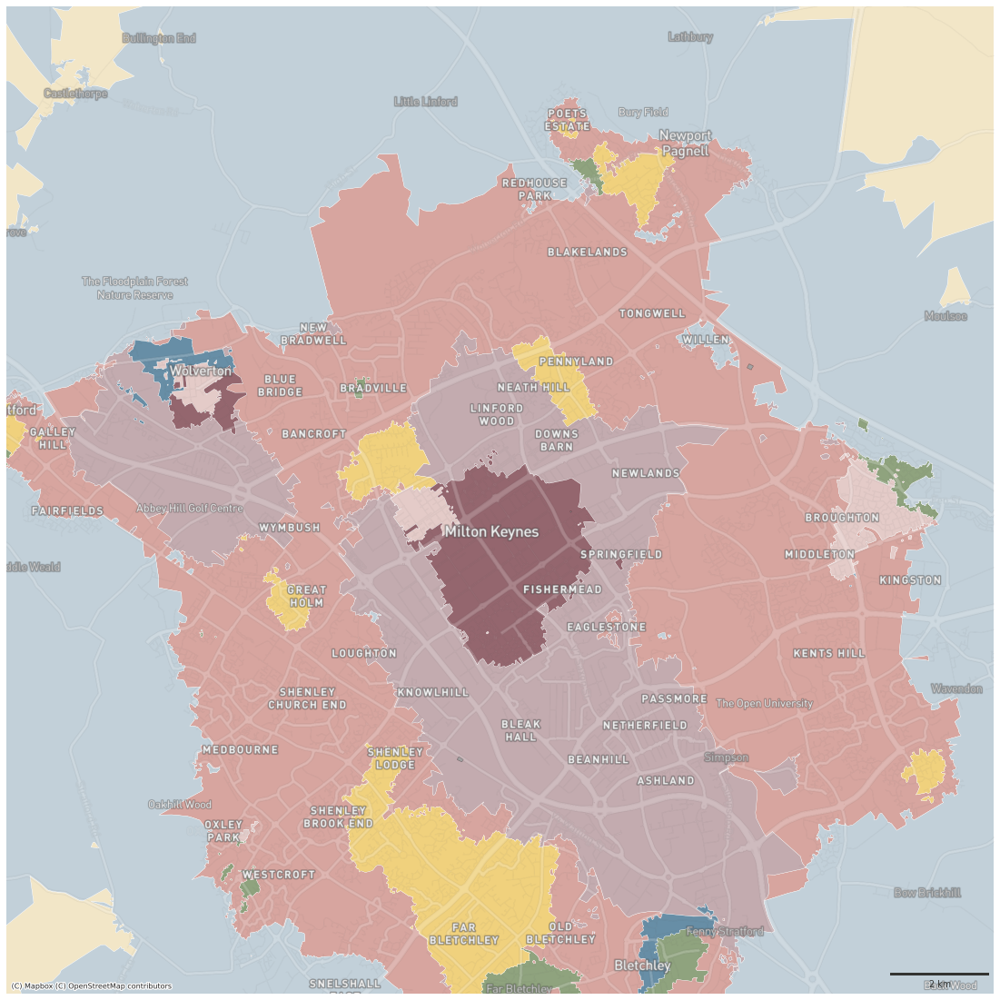

In [61]:
london_tier1 = gpd.GeoSeries(
    [Point(-0.7573699951171874, 52.046578650666554)], 
    crs=4326
).to_crs(3857).buffer(10000).total_bounds

selection = ['9_5', '9_1', '9_4', '9_2']

ax = df.plot(
    color=df['signature_type'].map(symbology),
    figsize=(20, 20), 
    zorder=1, 
    linewidth=.3, 
    edgecolor='w', 
    alpha=1
)
ax.set_xlim(london_tier1[0], london_tier1[2])
ax.set_ylim(london_tier1[1], london_tier1[3])

ax = add_maps(ax, df.crs, roads=True, lbls=True)
ax.set_axis_off()

scalebar = ScaleBar(
    dx=1,
    color=ugg.COLORS[0],
    location='lower right',
    height_fraction=0.002,
    pad=.5,
    frameon=False,
)
ax.add_artist(scalebar)
plt.savefig(
    "../fig/gb/urb_tier_4.png", dpi=300, bbox_inches="tight"
);

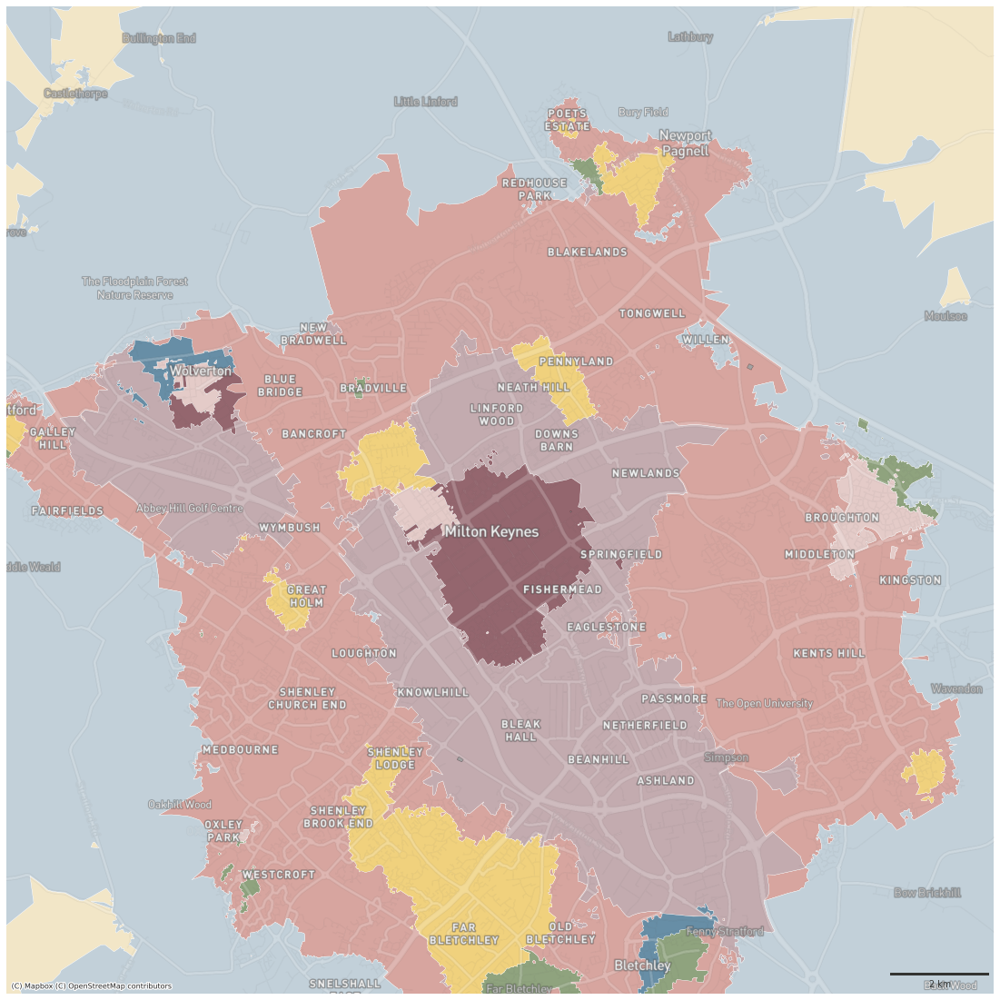

In [61]:
london_tier1 = gpd.GeoSeries(
    [Point(-0.7573699951171874, 52.046578650666554)], 
    crs=4326
).to_crs(3857).buffer(10000).total_bounds

selection = ['9_5', '9_1', '9_4', '9_2']

ax = df.plot(
    color=df['signature_type'].map(symbology),
    figsize=(20, 20), 
    zorder=1, 
    linewidth=.3, 
    edgecolor='w', 
    alpha=1
)
ax.set_xlim(london_tier1[0], london_tier1[2])
ax.set_ylim(london_tier1[1], london_tier1[3])

ax = add_maps(ax, df.crs, roads=True, lbls=True)
ax.set_axis_off()

scalebar = ScaleBar(
    dx=1,
    color=ugg.COLORS[0],
    location='lower right',
    height_fraction=0.002,
    pad=.5,
    frameon=False,
)
ax.add_artist(scalebar)
plt.savefig(
    "../fig/gb/urb_tier_4.png", dpi=300, bbox_inches="tight"
);